In [1]:
using JLD2
using FourierFlows
using FourierFlows: parsevalsum2
using Printf
using CairoMakie
using AbstractFFTs

include("../../rsw/RSWUtils.jl")
include("AnalysisUtils.jl")

mapfilter_snapshots (generic function with 1 method)

In [2]:
run_directory = "/vast/nad9961/mrsw/1106748"
params_file = jldopen(@sprintf("%s/%s.%06d.jld2", run_directory, "rsw", 0))
nν = params_file["params/nν"]
ν = params_file["params/ν"]
close(params_file)
nx, Lx = get_grid_size(run_directory, "rsw")
grid = TwoDGrid(; nx, Lx)
f, Cg2 = read_rsw_params(run_directory)
params = (; f, Cg2)
bases = compute_balanced_wave_bases(grid, params);

In [2]:
function compute_derivatives(uh, vh, ηh, grid, params)
    uxh = @. 1im * grid.kr * uh
    vxh = @. 1im * grid.kr * vh
    ηxh = @. 1im * grid.kr * ηh
    uyh = @. 1im * grid.l  * uh
    vyh = @. 1im * grid.l  * vh
    ηyh = @. 1im * grid.l  * ηh

    qh = @. 1im * grid.kr * vh - 1im * grid.l * uh - params.f * ηh
    
    u  = irfft(uh, grid.nx)
    v  = irfft(vh, grid.nx)
    η  = irfft(ηh, grid.nx)
    ux = irfft(uxh, grid.nx)
    vx = irfft(vxh, grid.nx)
    ηx = irfft(ηxh, grid.nx)
    uy = irfft(uyh, grid.nx)
    vy = irfft(vyh, grid.nx)
    ηy = irfft(ηyh, grid.nx)

    return (u, v, η, ux, vx, ηx, uy, vy, ηy, qh)
end
function compute_duvηdth(field_set_1, field_set_2, grid)
    u1, v1, η1, ux1, vx1, ηx1, uy1, vy1, ηy1 = field_set_1
    u2, v2, η2, ux2, vx2, ηx2, uy2, vy2, ηy2 = field_set_2
    uuxh = rfft(u1 .* ux2)
    vuyh = rfft(v1 .* uy2)
    uvxh = rfft(u1 .* vx2)
    vvyh = rfft(v1 .* vy2)
    uηxh = rfft(u1 .* ηx2)
    vηyh = rfft(v1 .* ηy2)
    ηuh  = rfft(η1 .* u2)
    ηvh  = rfft(η1 .* v2)
    divηuh   = @. 1im * grid.kr * ηuh + 1im * grid.l * ηvh

    dudth = @. (-uuxh - vuyh)# + D * uh + f0 * vh - Cg2 * ηxh)
    dvdth = @. (-uvxh - vvyh)# + D * vh - f0 * uh - Cg2 * ηyh)
    dηdth = @. (-divηuh)# + D * ηh - uxh - vyh)

    return dudth, dvdth, dηdth
    
end

function compute_flux_fields(uh, vh, ηh, qh, quadratic_terms, grid, params)
    dudth, dvdth, dηdth = quadratic_terms
    Euh = @. conj(uh) * dudth
    Evh = @. conj(vh) * dvdth
    Eηh = @. conj(ηh) * dηdth
    
    Eh = @. real(0.5*(Euh + Evh) + 0.5 * params.Cg2 * Eηh)
    Zh = @. real(conj(qh) * (1im * grid.kr * dvdth - 1im * grid.l * dudth - params.f * dηdth))

    return Eh, Zh
end

compute_flux_fields (generic function with 1 method)

In [3]:
t1, sol1 = load_key_snapshot(run_directory, "rsw", 300)
u1h = sol1[:,:,1]
v1h = sol1[:,:,2]
η1h = sol1[:,:,3]

t2, sol2 = load_key_snapshot(run_directory, "rsw", 301)
u2h = sol2[:,:,1]
v2h = sol2[:,:,2]
η2h = sol2[:,:,3]

c₀1, c₊1, c₋1 = compute_balanced_wave_weights(u1h, v1h, η1h, bases..., params)
((u1gh, v1gh, η1gh), (u1wh, v1wh, η1wh)) = wave_balanced_decomposition(u1h, v1h, η1h, grid, params)

c₀2, c₊2, c₋2 = compute_balanced_wave_weights(u2h, v2h, η2h, bases..., params)
((u2gh, v2gh, η2gh), (u2wh, v2wh, η2wh)) = wave_balanced_decomposition(u2h, v2h, η2h, grid, params)

total_field = compute_derivatives(u1h,  v1h,  η1h,  grid, params)
geo_field   = compute_derivatives(u1gh, v1gh, η1gh, grid, params)
wave_field  = compute_derivatives(u1wh, v1wh, η1wh, grid, params)

qh  = total_field[end]
qgh = geo_field[end]
qwh = wave_field[end]

total_quadratic_terms = compute_duvηdth(total_field, total_field, grid)
dEdt, dZdt = compute_flux_fields(u1h, v1h, η1h, qh, total_quadratic_terms, grid, params)

LoadError: UndefVarError: `run_directory` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [10]:
E1 = abs2.(c₀1) + abs2.(c₊1) + abs2.(c₋1)
E2 = abs2.(c₀2) + abs2.(c₊2) + abs2.(c₋2)
u1 = irfft(u1h, grid.nx)
v1 = irfft(v1h, grid.nx)
η1 = irfft(η1h, grid.nx)
u2 = irfft(u2h, grid.nx)
v2 = irfft(v2h, grid.nx)
η2 = irfft(η2h, grid.nx)

E1     = (u1.^2 + v1.^2) + params.Cg2*η1.^2
E2     = (u2.^2 + v2.^2) + params.Cg2*η2.^2
E1_cub = (1 .+ η1) .* (u1.^2 + v1.^2) + params.Cg2*η1.^2
E2_cub = (1 .+ η2) .* (u2.^2 + v2.^2) + params.Cg2*η2.^2

println(sum(E1))
println(sum(E1_cub))
println(sum(E2_cub))
println((sum(E2_cub - E1_cub)) / sum(E1_cub))

println((sum(E2 - E1)) / sum(E1))

LoadError: UndefVarError: `c₀1` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

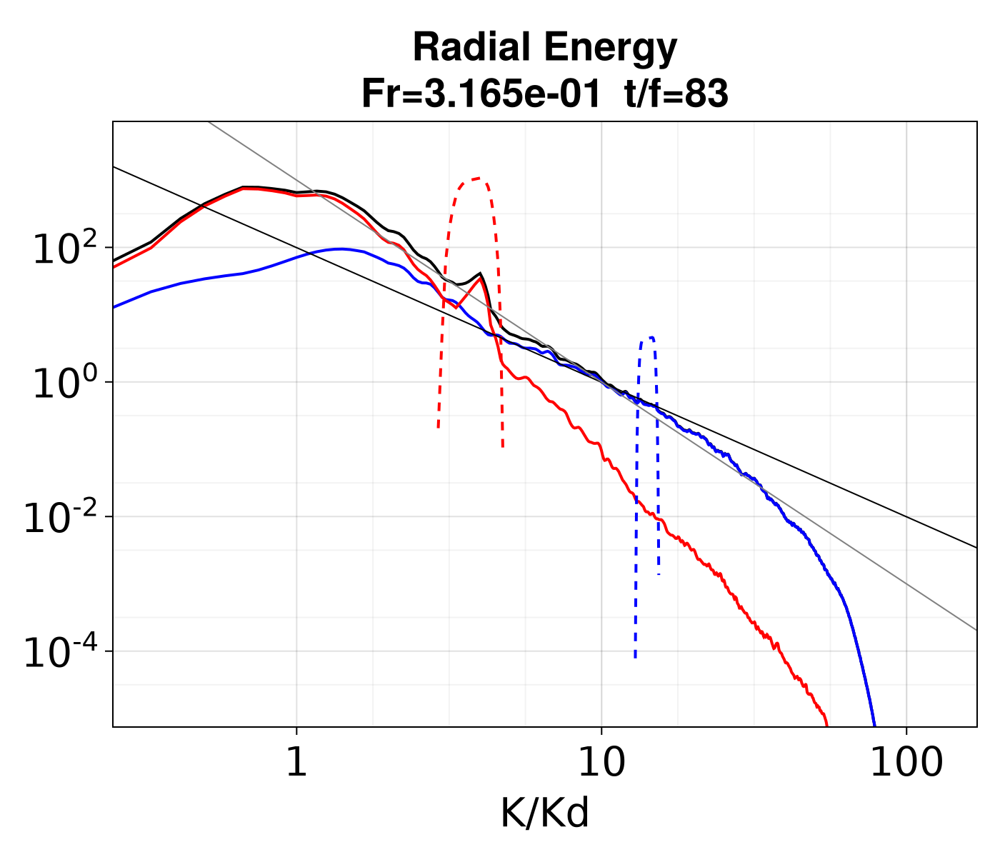

In [5]:
run_directory = "/vast/nad9961/lrsw/1651008/" # LRSW stronger background flow, smaller time step, weaker dissipation
#run_directory = "/vast/nad9961/lrsw/1618754/" # LRSW stronger background flow, smaller time step
#run_directory = "/vast/nad9961/lrsw/1514819/" # LRSW stronger background flow
#run_directory = "/vast/nad9961/mrsw/1403189/" # Best chance of induced diffusion, MRSW
#run_directory = "/vast/nad9961/lrsw/1409580/" # Best chance of getting induced diffusion
#run_directory = "/vast/nad9961/lrsw/1235390" # Lindborg model with ag = 0.0
#run_directory = "/vast/nad9961/lrsw/1208385/" # Lindborg model with ag = 3.0
#run_directory = "/vast/nad9961/lrsw/1206053/" # Lindborg model with ag = 0.5
#run_directory = "/vast/nad9961/mrsw/1132071/" # geostrophic component
#run_directory = "/vast/nad9961/mrsw/1106748/" # No geostrophic component
#run_directory = "/vast/nad9961/rsw/1105449/2/"
nx, Lx = get_grid_size(run_directory, "rsw")
grid = TwoDGrid(; nx, Lx)
f, Cg2 = read_rsw_params(run_directory)
Kd = f/sqrt(Cg2)
ν, nν = read_rsw_dissipation(run_directory)
params = (; f, Cg2, ν, nν)
bases = compute_balanced_wave_bases(grid, params)

Nsnaps = count_key_snapshots(run_directory, "rsw")
t0, sol0 = load_key_snapshot(run_directory, "rsw", 1)
u0h = sol0[:,:,1]
v0h = sol0[:,:,2]
η0h = sol0[:,:,3]

t_idx = Observable(2)
t1_sol1 = @lift load_key_snapshot(run_directory, "rsw", $t_idx)
t1 = @lift $t1_sol1[1]
sol1 = @lift $t1_sol1[2]
u1h = @lift $sol1[:,:,1]
v1h = @lift $sol1[:,:,2]
η1h = @lift $sol1[:,:,3]

wave_geo = @lift wave_balanced_decomposition($u1h, $v1h, $η1h, grid, params)
((u0gh, v0gh, η0gh), (u0wh, v0wh, η0wh)) = wave_balanced_decomposition(u0h, v0h, η0h, grid, params)
u1gh = @lift $wave_geo[1][1]
v1gh = @lift $wave_geo[1][2]
η1gh = @lift $wave_geo[1][3]
u1wh = @lift $wave_geo[2][1]
v1wh = @lift $wave_geo[2][2]
η1wh = @lift $wave_geo[2][3]

#u1 = irfft(u1wh, grid.nx)
#v1 = irfft(v1wh, grid.nx)
#η1 = irfft(η1wh, grid.nx)
#one_plus_η = @. 1 + η1
#sqrt_one_plus_η = @. sqrt(one_plus_η)
#quad_sqrt_pe = @. sqrt(1 - η1 + η1^2)
#mu1 = @. sqrt_one_plus_η * u1
#mv1 = @. sqrt_one_plus_η * v1
#mη1 = @. 1/sqrt_one_plus_η

#mu1h = rfft(mu1)
#mv1h = rfft(mv1)
#mη1h = rfft(mη1)
#quad_sqrt_peh = rfft(quad_sqrt_pe)

#E1 = (u1.^2 + v1.^2) + params.Cg2*η1.^2
#E1_cub = (1 .+ η1) .* (u1.^2 + v1.^2) + params.Cg2*η1.^2
#println(mean(abs.(η1)))

ug2_total = @lift (FourierFlows.parsevalsum2($u1gh, grid) + FourierFlows.parsevalsum2($v1gh, grid))
ug_rms = @lift sqrt.($ug2_total/grid.Lx/grid.Ly)
Fr = @lift $ug_rms / sqrt.(Cg2)

function sqrt_APE(ηh, grid)
    η = irfft(ηh, grid.nx)
    APE = @. 0*0.5*η - 0*1 + 1/(1 + η)
    sqrt_APE = @. sqrt.(APE)
    sqrt_APEh = rfft(sqrt_APE)
    return sqrt_APEh#[1,1]
end

fig = Figure(; size=(700, 600), fontsize=28, fonts = (; regular = "Dejavu"))
#ρ, Ehr1 = FourierFlows.radialspectrum(abs.(rfft(E1)), grid)
#ρ, Ehr2 = FourierFlows.radialspectrum(0.5*(abs2.(u1wh) + abs2.(v1wh) + params.Cg2*abs.(sqrt_APE(η1wh, grid))) / grid.nx^2 / grid.Lx^2, grid)
#ρ, Ehr3 = FourierFlows.radialspectrum(0.5*(abs2.(u1gh) + abs2.(v1gh) + params.Cg2*abs.(sqrt_APE(η1gh, grid))) / grid.nx^2 / grid.Lx^2, grid)
ρ, Ehr02 = FourierFlows.radialspectrum(0.5*(abs2.(u0wh) + abs2.(v0wh) + params.Cg2*abs2.(η0wh)) / grid.nx^2 / grid.Lx^2, grid)
ρ, Ehr03 = FourierFlows.radialspectrum(0.5*(abs2.(u0gh) + abs2.(v0gh) + params.Cg2*abs2.(η0gh)) / grid.nx^2 / grid.Lx^2, grid)
ρEhr2 = @lift FourierFlows.radialspectrum(0.5*(abs2.($u1wh) + abs2.($v1wh) + params.Cg2*abs2.($η1wh)) / grid.nx^2 / grid.Lx^2, grid)
Ehr2 = @lift $ρEhr2[2][:]
ρEhr3 = @lift FourierFlows.radialspectrum(0.5*(abs2.($u1gh) + abs2.($v1gh) + params.Cg2*abs2.($η1gh)) / grid.nx^2 / grid.Lx^2, grid)
Ehr3 = @lift $ρEhr3[2][:]
totalE = @lift $Ehr2 + $Ehr3
#ρ, ηr = FourierFlows.radialspectrum(abs2.(η1h) / grid.nx^2 * grid.Lx^2, grid)
#ρ, ur = FourierFlows.radialspectrum(abs2.(u1h) / grid.nx^2 * grid.Lx^2, grid)
max_E = @lift max(maximum($Ehr2), maximum($Ehr3))
ytickvals=10. .^ (-12:2:2)
yticklabels = [rich("10", superscript(@sprintf("%d", value))) for value=-12:2:2]
yminorticks = 10. .^ ((-12:2) .+ 0.5)
xminorticks = 10. .^ (0.25:0.25:3)
limits = @lift ((3 * ρ[2]/Kd, ρ[end]/Kd), (1e-8 * $max_E, 10 * $max_E))
ax_opts = (; xscale=log10, yscale=log10, 
        xlabel="K/Kd", xticks=[1, 10, 100, 1000], 
        yticks=(ytickvals, yticklabels),
        xminorticks,
        xminorgridvisible=true,
        yminorticks,
        yminorgridvisible=true,
        limits=limits)
title=@lift @sprintf("Radial Energy\nFr=%0.3e\tt/f=%0.0f", $Fr, $t1/f)
ax = Axis(fig[1,1]; xscale=log10, yscale=log10, title=title, ax_opts...)

ω = @. sqrt(f^2 + Cg2*ρ^2)
#lines!(ax, ω/f, Cg2*Ehr2[:].*ω./ρ; linewidth=1)
lines!(ax, ρ/Kd, totalE; linewidth=2, color=:black, label="Total energy")
lines!(ax, ρ/Kd, Ehr2; linewidth=2, color=:blue, label="Wave energy")
lines!(ax, ρ/Kd, Ehr3; linewidth=2, color=:red, label="Geostrophic Energy")
lines!(ax, ρ/Kd, Ehr02[:]; linewidth=2, color=:blue, linestyle=:dash, label="Initial Wave energy")
lines!(ax, ρ/Kd, Ehr03[:]; linewidth=2, color=:red, linestyle=:dash, label="Initial Geostrophic Energy")
freq_energy = @lift Cg2*$Ehr2.*ω./ρ
#ω10_idx = findfirst(x -> x >= 10, ω/f)
#E10 = freq_energy[ω10_idx]
#lines!(ax, ω/f, E10*(ω/ω[ω10_idx]).^(-2), label=rich("ω", superscript("-2")), color="black", linestyle=:dash)
#lines!(ax, ω/f, E10*(ω/ω[ω10_idx]).^(-3), label=rich("ω", superscript("-3")), color="gray", linestyle=:dash)
#ω10_idx = findfirst(x -> x >= 10, ω/f)

ρ10_idx = findfirst(x -> x >= 10, ρ/f)
E10 = @lift $Ehr2[ρ10_idx]
power_2 = @lift $E10*(ρ/ρ[ρ10_idx]).^(-2)
power_3 = @lift $E10*(ρ/ρ[ρ10_idx]).^(-3)
lines!(ax, ρ/Kd, power_2, label=rich("K", superscript("-2")), color="black", linestyle=:solid, linewidth=1)
lines!(ax, ρ/Kd, power_3, label=rich("K", superscript("-3")), color="gray", linestyle=:solid, linewidth=1)
#axislegend(ax, position=:lb)
resize_to_layout!(fig)

record(fig, "energy_animation.mp4", [Nsnaps-50]; framerate = 24) do frame
    t_idx[] = frame
end
#save(@sprintf("images/energy_comparison_Fr=%0.3f.eps", Fr), fig)
fig

388526.22
328001.7


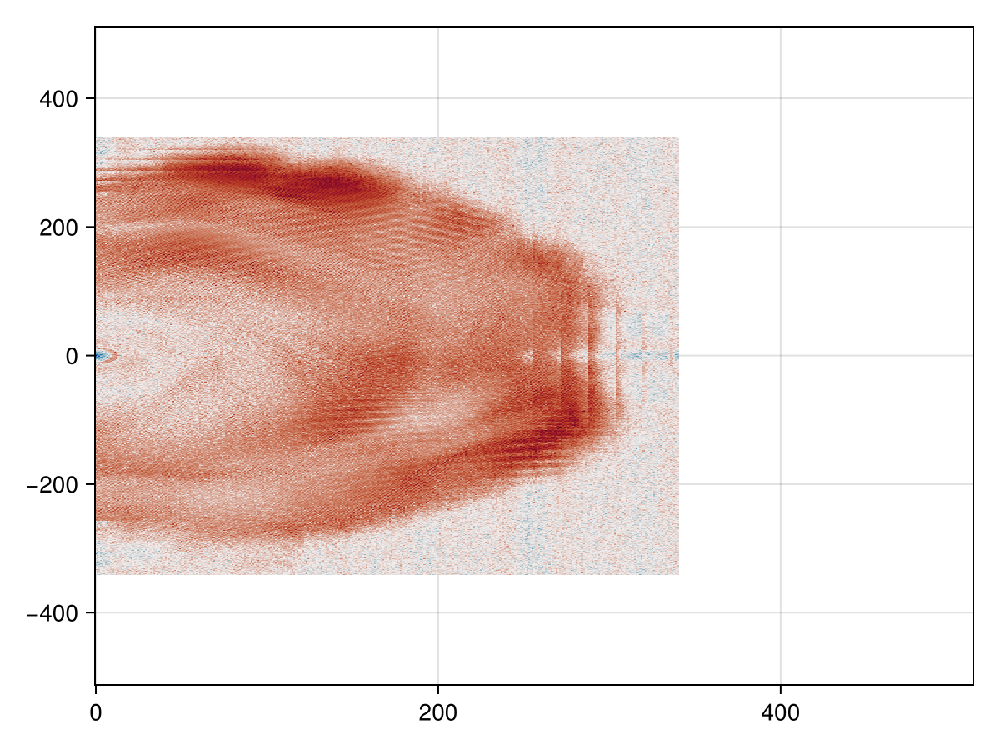

In [24]:
run_directory = "/vast/nad9961/lrsw/1618754/" # LRSW stronger background flow

function compute_energy(sol, grid, params)
    u = irfft(sol[:,:,1], grid.nx)
    v = irfft(sol[:,:,2], grid.nx)
    η = irfft(sol[:,:,3], grid.nx)
    return sum(u.^2 + v.^2 + params.Cg2*η.^2)
    #return 0.5 * (parsevalsum2(sol[:,:,1], grid) + parsevalsum2(sol[:,:,2], grid) + params.Cg2 * parsevalsum2(sol[:,:,3], grid))
end
Nsnaps = count_key_snapshots(run_directory, "rsw")
t0, sol0 = load_key_snapshot(run_directory, "rsw", 3)
println(compute_energy(sol0, grid, params))

t1, sol1 = load_key_snapshot(run_directory, "rsw", Nsnaps)
println(compute_energy(sol1, grid, params))

ν, nν = read_dissipation(run_directory, "rsw")
diss_energy = real.(sum(conj.(sol0) .* sol0, dims=3)[:,:,1])
ρ, dDissdt = FourierFlows.radialspectrum(abs2.(sol0[:,:,1]), grid)
ρ, dDiss0dt = FourierFlows.radialspectrum(abs2.(sol1[:,:,1]), grid)
ρ, dνdt = FourierFlows.radialspectrum(ν*((grid.Krsq).^(nν) .* abs2.(sol0[:,:,1])), grid)

E1 = sum(abs2.(sol0), dims=3)[:,:,1]
E2 = sum(abs2.(sol1), dims=3)[:,:,1]

fig = Figure()
#ax = Axis(fig[1,1]; xscale=log10, limits=((ρ[2], ρ[end]), (-1e9, 1e9)))
ax2 = Axis(fig[1,1])
heatmap!(ax2, grid.kr[:], fftshift(grid.l[:]), fftshift(log.(E1) - log.(E2), 2), colormap=:balance)
#lines!(ax, ρ[2:end], dDissdt[2:end])
#lines!(ax, ρ[2:end], dDissdt[2:end] - dDiss0dt[2:end])
#lines!(ax, ρ[2:end], dνdt[2:end])
#lines!(ax, ρ[2:end], 1e11*(ρ[2:end]).^(-3))
#lines!([grid.kr[end]*2/3, grid.kr[end]*2/3], [1, 1e10])
fig

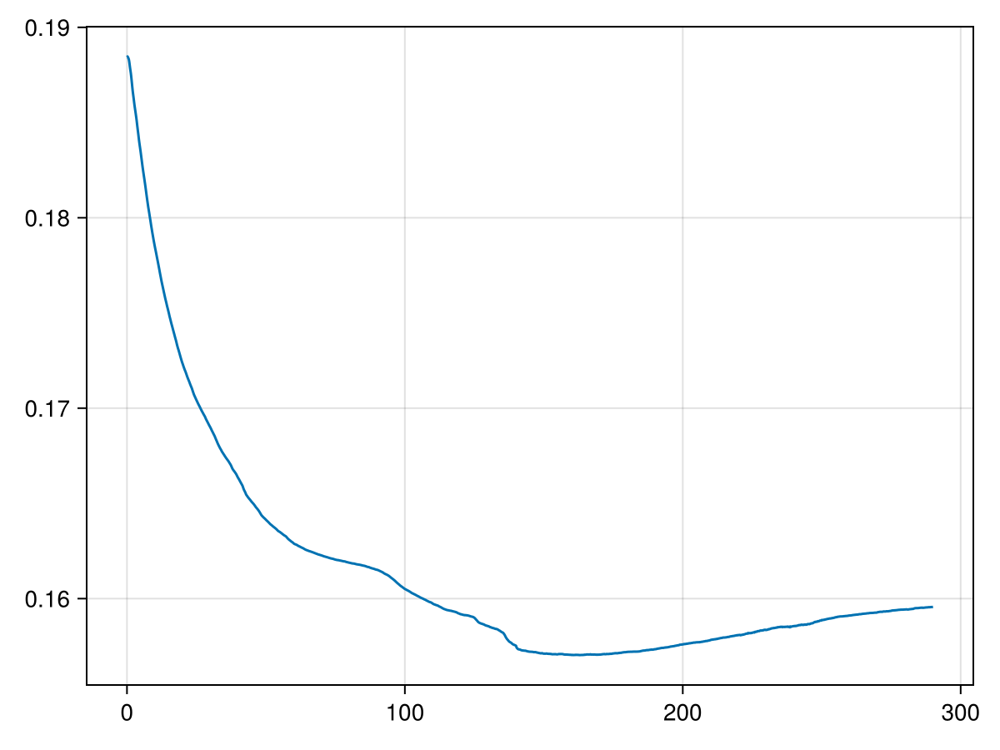

In [27]:
diag_file = jldopen(run_directory * "diagnostics.jld2")
t = diag_file["diagnostics/KE/t"]
E = diag_file["diagnostics/KE/data"] + diag_file["diagnostics/PE/data"]
close(diag_file)

lines(t, E)

In [ ]:
run_directory = "/vast/nad9961/rsw/1105449/2/"
nx, Lx = get_grid_size(run_directory, "rsw")
grid = TwoDGrid(; nx, Lx)
f, Cg2 = read_rsw_params(run_directory)
Kd = f/sqrt(Cg2)
ν, nν = read_rsw_dissipation(run_directory)
params = (; f, Cg2, ν, nν)
bases = compute_balanced_wave_bases(grid, params)

Nsnaps = count_key_snapshots(run_directory, "rsw")
t1, sol1 = load_key_snapshot(run_directory, "rsw", 100)
u1h = sol1[:,:,1]
v1h = sol1[:,:,2]
η1h = sol1[:,:,3]
u1 = irfft(u1h, grid.nx)
v1 = irfft(v1h, grid.nx)
η1 = irfft(η1h, grid.nx)
one_plus_η = @. 1 + η1
sqrt_one_plus_η = @. sqrt(one_plus_η)
quad_sqrt_pe = @. sqrt(1 - η1 + η1^2)
mu1 = @. sqrt_one_plus_η * u1
mv1 = @. sqrt_one_plus_η * v1
mη1 = @. 1/sqrt_one_plus_η

mu1h = rfft(mu1)
mv1h = rfft(mv1)
mη1h = rfft(mη1)
quad_sqrt_peh = rfft(quad_sqrt_pe)

E1 = (u1.^2 + v1.^2) + params.Cg2*η1.^2
E1_cub = (1 .+ η1) .* (u1.^2 + v1.^2) + params.Cg2*η1.^2
println(mean(abs.(η1)))

((u1gh, v1gh, η1gh), (u1wh, v1wh, η1wh)) = wave_balanced_decomposition(u1h, v1h, η1h, grid, params)
ug2_total = (FourierFlows.parsevalsum2(u1gh, grid) + FourierFlows.parsevalsum2(v1gh, grid))
ug_rms = sqrt.(ug2_total/grid.Lx/grid.Ly)
Fr = ug_rms / sqrt.(Cg2)

ρ, Ehr1 = FourierFlows.radialspectrum(abs.(rfft(E1)), grid)
ρ, Ehr2 = FourierFlows.radialspectrum(0.5*(abs2.(u1h) + abs2.(v1h) + params.Cg2*abs2.(quad_sqrt_peh)) / grid.nx^2 / grid.Lx^2, grid)
ρ, Ehr3 = FourierFlows.radialspectrum(0.5*(abs2.(mu1h) + abs2.(mv1h) + params.Cg2*abs2.(mη1h)) / grid.nx^2 / grid.Lx^2, grid)
#ρ, ηr = FourierFlows.radialspectrum(abs2.(η1h) / grid.nx^2 * grid.Lx^2, grid)
#ρ, ur = FourierFlows.radialspectrum(abs2.(u1h) / grid.nx^2 * grid.Lx^2, grid)
max_E = max(maximum(Ehr2), maximum(Ehr3))
ytickvals=10. .^ (-12:2:2)
yticklabels = [rich("10", superscript(@sprintf("%d", value))) for value=-12:2:2]
yminorticks = 10. .^ ((-12:2) .+ 0.5)
xminorticks = 10. .^ (0.25:0.25:3)
ax_opts = (; xscale=log10, yscale=log10, 
        xlabel="ω/f", xticks=[1, 10, 100, 1000], 
        yticks=(ytickvals, yticklabels),
        xminorticks,
        xminorgridvisible=true,
        yminorticks,
        yminorgridvisible=true,
        limits=((3 * ρ[2]/Kd, ρ[end]/Kd), (1e-8 * max_E, 10 * max_E)))
ax = Axis(fig[1,2]; xscale=log10, yscale=log10, title=@sprintf("Modified Radial Energy\nFr=%0.3e", Fr), ax_opts...)

ω = @. sqrt(f^2 + Cg2*ρ^2)
#lines!(ax, ω/f, Cg2*Ehr2[:].*ω./ρ; linewidth=1)
lines!(ax, ρ/Kd, Ehr2[:]; linewidth=2, color=:black, label="Quadratic energy")
lines!(ax, ρ/Kd, Ehr3[:]; linewidth=2, color=:red, label="Full Energy")
freq_energy = Cg2*Ehr2[:].*ω./ρ
ω10_idx = findfirst(x -> x >= 10, ω/f)
E10 = freq_energy[ω10_idx]
lines!(ax, ω/f, E10*(ω/ω[ω10_idx]).^(-2), label=rich("ω", superscript("-2")), color="black", linestyle=:dash)
lines!(ax, ω/f, E10*(ω/ω[ω10_idx]).^(-3), label=rich("ω", superscript("-3")), color="gray", linestyle=:dash)
axislegend(ax, position=:rt)
resize_to_layout!(fig)

save(@sprintf("images/energy_comparison_Fr=%0.3f.eps", Fr), fig)
fig

In [23]:
dω = diff(ω)
dρ = diff(ρ)
println(sum((Ehr2.*ω./ρ)[2:end].*dω))
println(sum(Ehr2[2:end].*dρ))

7.186115513426568
7.191721088300856


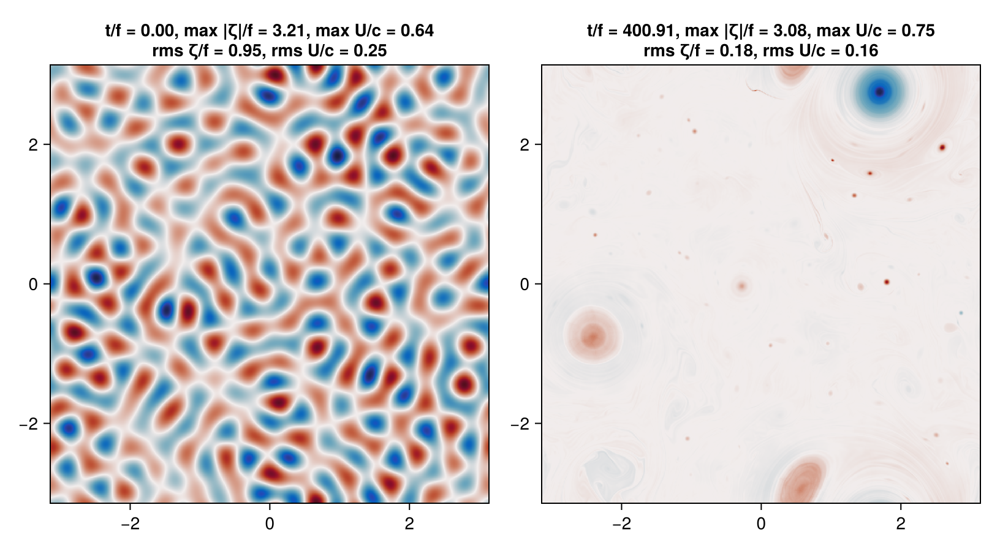

In [24]:
function compute_ζh(sol, grid, params)
    uh = sol[:,:,1]
    vh = sol[:,:,2]
    ηh = sol[:,:,3]
    vxh = 1im * grid.kr .* vh
    uyh = 1im * grid.l  .* uh
    ζh = vxh - uyh
    return ζh
end

function compute_U(sol, grid, params)
    uh = sol[:,:,1]
    vh = sol[:,:,2]
    ηh = sol[:,:,3]
    u = irfft(uh, grid.nx)
    v = irfft(vh, grid.nx)
    return @. sqrt(u^2 + v^2)
end

function rms(field, grid)
    return sqrt.(sum(field.^2/grid.nx/grid.ny))
end


#run_directory = "/vast/nad9961/rsw/66007029/2"
run_directory = "/scratch/nad9961/rsw_ray/214386"
nx, Lx = get_grid_size(run_directory, "rsw")
grid = TwoDGrid(; nx, Lx)
f, Cg2 = read_rsw_params(run_directory)
Kd = f/sqrt(Cg2)
ν, nν = read_rsw_dissipation(run_directory)
params = (; f, Cg2, ν, nν)
bases = compute_balanced_wave_bases(grid, params)

Nsnaps = count_key_snapshots(run_directory, "rsw")

t0, sol0 = load_key_snapshot(run_directory, "rsw", 1)
t1, sol1 = load_key_snapshot(run_directory, "rsw", Nsnaps)

ζ0h = compute_ζh(sol0, grid, params)
ζ1h = compute_ζh(sol1, grid, params)

ζ0 = irfft(ζ0h, grid.nx)
U0 = compute_U(sol0, grid, params)
ζ0_max = maximum(abs.(ζ0))
U0_max = maximum(U0)
ζ0_rms = rms(ζ0, grid)
U0_rms = rms(U0, grid)

ζ1 = irfft(ζ1h, grid.nx)
U1 = compute_U(sol1, grid, params)
ζ1_max = maximum(abs.(ζ1))
U1_max = maximum(U1)
ζ1_rms = rms(ζ1, grid)
U1_rms = rms(U1, grid)

ζmax = max(ζ0_max, ζ1_max)
crange = (-ζmax, ζmax)
ax_opts = (colormap=:balance, rasterize=true, colorrange=crange)

fig = Figure()
c = sqrt(params.Cg2)
ax1 = Axis(fig[1,1]; title=@sprintf("t/f = %0.2f, max |ζ|/f = %0.2f, max U/c = %0.2f\nrms ζ/f = %0.2f, rms U/c = %0.2f", 
        t0/params.f, ζ0_max/params.f, U0_max/c, ζ0_rms/params.f, U0_rms/c))
ax2 = Axis(fig[1,2]; title=@sprintf("t/f = %0.2f, max |ζ|/f = %0.2f, max U/c = %0.2f\nrms ζ/f = %0.2f, rms U/c = %0.2f", 
        t1/params.f, ζ1_max/params.f, U1_max/c, ζ1_rms/params.f, U1_rms/c))
heatmap!(ax1, grid.x, grid.y, ζ0; ax_opts...)
heatmap!(ax2, grid.x, grid.y, ζ1; ax_opts...)
colsize!(fig.layout, 1, Aspect(1, 1.0))
colsize!(fig.layout, 2, Aspect(1, 1.0))
resize_to_layout!(fig)

fig

In [7]:
FourierFlows.parsevalsum((abs2.(u1h) + abs2.(v1h) + params.Cg2*abs2.(η1h)) / grid.nx^2 * grid.Lx^2, grid)
FourierFlows.parsevalsum((abs2.(u1h) + abs2.(v1h) + params.Cg2*abs2.(η1h)) / grid.nx^2 * grid.Lx^2, grid)

1.892756709732469e-5

In [8]:
println(FourierFlows.parsevalsum(abs.(rfft(E1)), grid))
println(FourierFlows.parsevalsum(abs2.(u1h) + abs2.(v1h) + params.Cg2*abs2.(η1h), grid) / grid.nx^2 * grid.Lx^2)

1.8588558036237688e-5
1.8927565795536653e-5


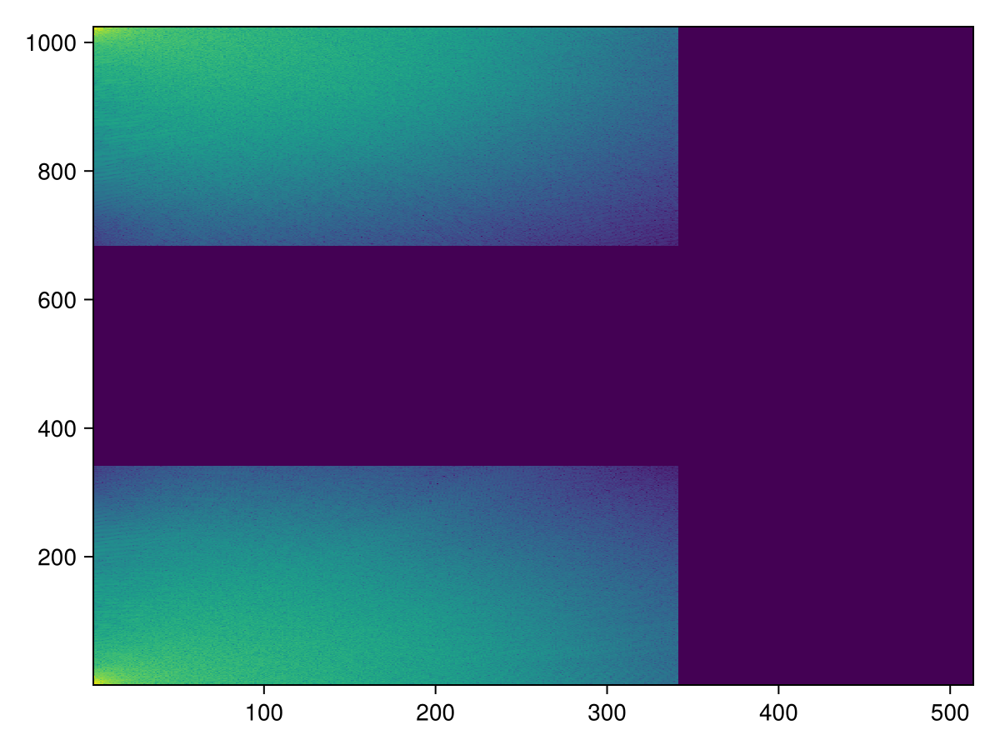

In [9]:
heatmap(log.(abs2.(u1h)))

In [22]:
function quad_energy(uh, vh, ηh, params)
    η = irfft(ηh, grid.nx)
    root_APE = 1 .+ η
    root_APEh = rfft(root_APE)
    return FourierFlows.parsevalsum(abs2.(uh) + abs2.(vh) + params.Cg2*abs2.(root_APEh), grid)
end

function transfer_function(uh, vh, ηh, params)
    uxh = @. 1im * grid.kr * uh
    vxh = @. 1im * grid.kr * vh
    ηxh = @. 1im * grid.kr * ηh
    uyh = @. 1im * grid.l  * uh
    vyh = @. 1im * grid.l  * vh
    ηyh = @. 1im * grid.l  * ηh
    u  = irfft(uh, grid.nx)
    v  = irfft(vh, grid.nx)
    η  = irfft(ηh, grid.nx)
    ux = irfft(uxh, grid.nx)
    vx = irfft(vxh, grid.nx)
    ηx = irfft(ηxh, grid.nx)
    uy = irfft(uyh, grid.nx)
    vy = irfft(vyh, grid.nx)
    ηy = irfft(ηyh, grid.nx)

    uuxh = rfft(u .* ux)
    vuyh = rfft(v .* uy)
    
    uvxh = rfft(u .* vx)
    vvyh = rfft(v .* vy)

    ηuh  = rfft(η .* u)
    ηvh  = rfft(η .* v)
    divηuh   = @. 1im * grid.kr * ηuh + 1im * grid.l * ηvh

    dudth = @. (-uuxh - vuyh + params.f * vh - params.Cg2 * ηxh)
    dvdth = @. (-uvxh - vvyh * vh - params.f * uh - params.Cg2 * ηyh)
    dηdth = @. (-divηuh - uxh - vyh)
    return real.(conj(uh) .* dudth + conj(vh) .* dvdth + params.Cg2 * conj(ηh) .* dηdth)
end

function cubic_energy(uh, vh, ηh, params)
    u = irfft(uh, grid.nx)
    v = irfft(vh, grid.nx)
    η = irfft(ηh, grid.nx)
    root_APE = 1 .+ η
    root_APEh = rfft(root_APE)
    mu = @. sqrt(1 + η) * u
    mv = @. sqrt(1 + η) * v
    muh = rfft(mu)
    mvh = rfft(mv)

    return FourierFlows.parsevalsum(abs2.(muh) + abs2.(mvh) + params.Cg2*abs2.(root_APEh), grid)
end

t1, sol = load_key_snapshot(run_directory, "rsw", 40)
Th = transfer_function(@views(sol[:,:,1]), @views(sol[:,:,2]), @views(sol[:,:,3]), params)
E1 = FourierFlows.parsevalsum(quad_energy(@views(sol[:,:,1]), @views(sol[:,:,2]), @views(sol[:,:,3]), params), grid)
println(FourierFlows.parsevalsum(Th, grid))
t2, sol = load_key_snapshot(run_directory, "rsw", 41)
E2 = FourierFlows.parsevalsum(quad_energy(@views(sol[:,:,1]), @views(sol[:,:,2]), @views(sol[:,:,3]), params), grid)
dEdt = (E2 - E1) / (t2 - t1)
println(dEdt)

3.3938182115300033
-1.47446943042303e-13


6.40046909444367e-6
-0.02738169384069078
1245.0759


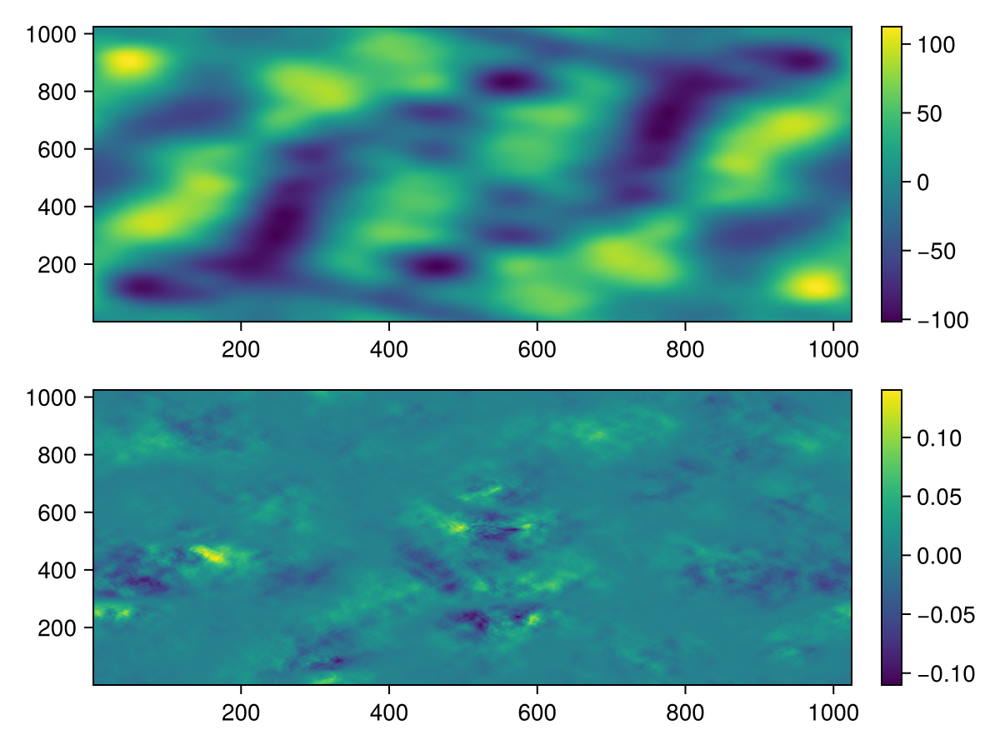

In [23]:
function dudt(uh, vh, ηh, params)
    dealias!(uh, grid)
    dealias!(vh, grid)
    dealias!(ηh, grid)
    uxh = @. 1im * grid.kr * uh
    vxh = @. 1im * grid.kr * vh
    ηxh = @. 1im * grid.kr * ηh
    uyh = @. 1im * grid.l  * uh
    vyh = @. 1im * grid.l  * vh
    ηyh = @. 1im * grid.l  * ηh
    u  = irfft(uh, grid.nx)
    v  = irfft(vh, grid.nx)
    η  = irfft(ηh, grid.nx)
    ux = irfft(uxh, grid.nx)
    vx = irfft(vxh, grid.nx)
    ηx = irfft(ηxh, grid.nx)
    uy = irfft(uyh, grid.nx)
    vy = irfft(vyh, grid.nx)
    ηy = irfft(ηyh, grid.nx)

    uuxh = rfft(u .* ux)
    dealias!(uuxh, grid)
    vuyh = rfft(v .* uy)
    
    uvxh = rfft(u .* vx)
    vvyh = rfft(v .* vy)

    ηuh  = rfft(η .* u)
    ηvh  = rfft(η .* v)
    divηuh   = @. 1im * grid.kr * ηuh + 1im * grid.l * ηvh

    D = @. -params.ν * grid.Krsq^(params.nν)
    dissh = D .* uh
    diss = irfft(dissh, grid.nx)

    dudth = @. (-uuxh)# - vuyh + params.f * vh - params.Cg2 * ηxh + dissh)
    dudt_real = @. (-u * ux)# - v * uy + params.f * v - params.Cg2 * ηx + diss)
    return (2*real.(conj(uh) .* dudth), 2*u.*dudt_real)
end

t1, sol = load_key_snapshot(run_directory, "rsw", 71)
Th, T = dudt(@views(sol[:,:,1]), @views(sol[:,:,2]), @views(sol[:,:,3]), params)
dealias!(Th, grid)
T_real = irfft(Th, grid.nx)

uh = sol[:,:,1]
u = irfft(uh, grid.nx)
E1 = abs2.(@views(sol[:,:,1]))
E1_real = abs2.(u)
t2, sol = load_key_snapshot(run_directory, "rsw", 72)
uh = sol[:,:,1]
u = irfft(uh, grid.nx)
E2 = abs2.(@views(sol[:,:,1]))
E2_real = abs2.(u)
fig = Figure()
ax1 = Axis(fig[1,1])
ax2 = Axis(fig[2,1])
hm =heatmap!(ax1, T_real)
Colorbar(fig[1,2], hm)
hm = heatmap!(ax2, (E2_real - E1_real) / (t2 - t1))
Colorbar(fig[2,2], hm)


println(sum(T))
println(sum(T_real))
println(sum((E2_real - E1_real) / (t2 - t1)))

fig

In [24]:
Npoints = 500
q_E = zeros(Npoints)
c_E = zeros(Npoints)
t_E = zeros(Npoints)
for i=1:Npoints
    t, sol = load_key_snapshot(run_directory, "rsw", i)
    q_E[i] = quad_energy(@views(sol[:,:,1]), @views(sol[:,:,2]), @views(sol[:,:,3]), params)
    c_E[i] = cubic_energy(@views(sol[:,:,1]), @views(sol[:,:,2]), @views(sol[:,:,3]), params)
    t_E[i] = t
end

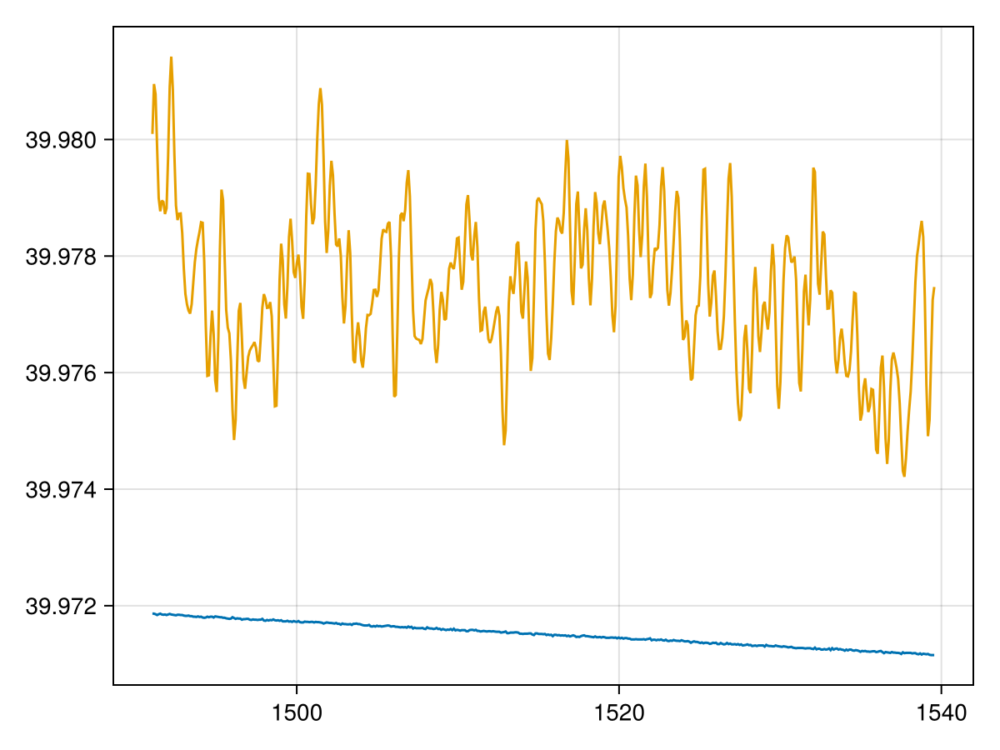

In [27]:
fig = Figure()
ax = Axis(fig[1,1])

lines!(ax, t_E[2:end], c_E[2:end])
lines!(ax, t_E[2:end], q_E[2:end])

fig

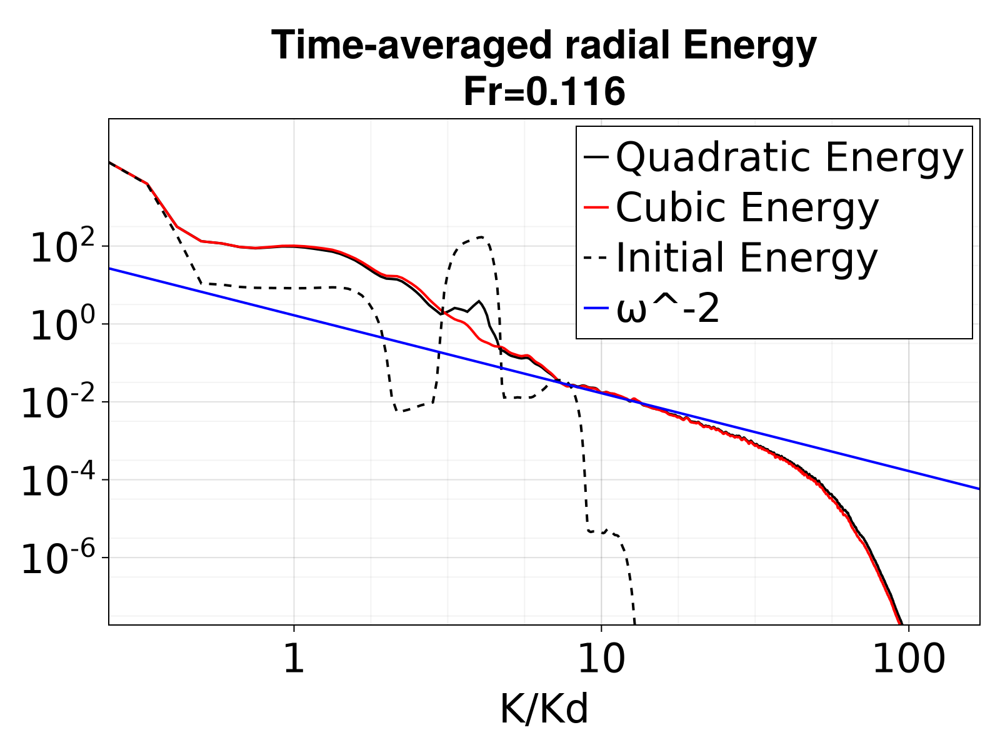

In [61]:
run_directory = "/vast/nad9961/rsw/65276574/6/"
nx, Lx = get_grid_size(run_directory, "rsw")
grid = TwoDGrid(; nx, Lx)
f, Cg2 = read_rsw_params(run_directory)
Kd = f/sqrt(Cg2)
ν, nν = read_rsw_dissipation(run_directory)
params = (; f, Cg2, ν, nν)
bases = compute_balanced_wave_bases(grid, params)

Nsnaps = count_key_snapshots(run_directory, "rsw")
t0, sol0 = load_key_snapshot(run_directory, "rsw", 1)
u0h = sol0[:,:,1]
v0h = sol0[:,:,2]
η0h = sol0[:,:,3]
u0 = irfft(u0h, grid.nx)
v0 = irfft(v0h, grid.nx)
η0 = irfft(η0h, grid.nx)
mu0 = @. sqrt(1 + η0) * u0
mv0 = @. sqrt(1 + η0) * v0

mu0h = rfft(mu0)
mv0h = rfft(mv0)

E0 = (u0.^2 + v0.^2) + params.Cg2*(η0 .+ 1).^2
E0_cub = (1 .+ η0) .* (u0.^2 + v0.^2) + params.Cg2*(η0 .+ 1).^2
E0_diff = η0 .* (u0.^2 + v0.^2)
root_PEh = rfft(1 .+ η0)
ρ, Ehr0 = FourierFlows.radialspectrum(0.5*(abs2.(mu0h) + abs2.(mv0h) + params.Cg2*abs2.(root_PEh)) / grid.nx^2 / grid.Lx^2, grid)


t1, sol1 = load_key_snapshot(run_directory, "rsw", Nsnaps)
u1h = sol1[:,:,1]
v1h = sol1[:,:,2]
η1h = sol1[:,:,3]

((ugh, vgh, ηgh), (uwh, vwh, ηwh)) = wave_balanced_decomposition(u1h, v1h, η1h, grid, params)
ug2_total = (FourierFlows.parsevalsum2(ugh, grid) + FourierFlows.parsevalsum2(vgh, grid))
ug_rms = sqrt.(ug2_total/grid.Lx/grid.Ly)
Fr = ug_rms / sqrt.(Cg2)
u1 = irfft(u1h, grid.nx)
v1 = irfft(v1h, grid.nx)
η1 = irfft(η1h, grid.nx)
mu1 = @. sqrt(1 + η1) * u1
mv1 = @. sqrt(1 + η1) * v1

mu1h = rfft(mu1)
mv1h = rfft(mv1)

E1 = (u1.^2 + v1.^2) + params.Cg2*(η1 .+ 1).^2
E1_cub = (1 .+ η1) .* (u1.^2 + v1.^2) + params.Cg2*(η1 .+ 1).^2
E1_diff = η1 .* (u1.^2 + v1.^2)
root_PEh = rfft(1 .+ η1)

fig = Figure(; size=(800, 600), fontsize=32, fonts = (; regular = "Dejavu"))
ρ, Ehr1 = FourierFlows.radialspectrum(abs.(rfft(E1)), grid)
ρ, Ehr2 = FourierFlows.radialspectrum(0.5*(abs2.(u1h) + abs2.(v1h) + params.Cg2*abs2.(root_PEh)) / grid.nx^2 / grid.Lx^2, grid)
ρ, Ehr3 = FourierFlows.radialspectrum(0.5*(abs2.(mu1h) + abs2.(mv1h) + params.Cg2*abs2.(root_PEh)) / grid.nx^2 / grid.Lx^2, grid)
ρ, ηr = FourierFlows.radialspectrum(abs2.(η1h) / grid.nx^2 * grid.Lx^2, grid)
ρ, ur = FourierFlows.radialspectrum(abs2.(u1h) / grid.nx^2 * grid.Lx^2, grid)
max_E = max(maximum(Ehr2), maximum(Ehr3))
ytickvals=10. .^ (-12:2:2)
yticklabels = [rich("10", superscript(@sprintf("%d", value))) for value=-12:2:2]
yminorticks = 10. .^ ((-12:2) .+ 0.5)
xminorticks = 10. .^ (0.25:0.25:3)
ax_opts = (; xscale=log10, yscale=log10,
        xlabel="K/Kd", xticks=[1, 10, 100, 1000], 
        yticks=(ytickvals, yticklabels),
        xminorticks,
        xminorgridvisible=true,
        yminorticks,
        yminorgridvisible=true,
        limits=((3 * ρ[2]/Kd, ρ[end]/Kd), (1e-12 * max_E, 10 * max_E))
)
ax = Axis(fig[1,1]; xscale=log10, yscale=log10, title=@sprintf("Time-averaged radial Energy\nFr=%0.3f", Fr), ax_opts...)


lines!(ax, ρ/Kd, Ehr2[:]; linewidth=2, color=:black, label="Quadratic Energy")
lines!(ax, ρ/Kd, Ehr3[:]; linewidth=2, color=:red, label="Cubic Energy")
lines!(ax, ρ/Kd, Ehr0[:]; linewidth=2, color=:black, linestyle=:dash, label="Initial Energy")
lines!(ax, ρ/Kd, 15*ρ.^(-2); linewidth=2, color=:blue, label="ω^-2")
axislegend(ax, position=:rt)

save(@sprintf("images/energy_comparison_Fr=%0.3f.png", Fr), fig)
fig

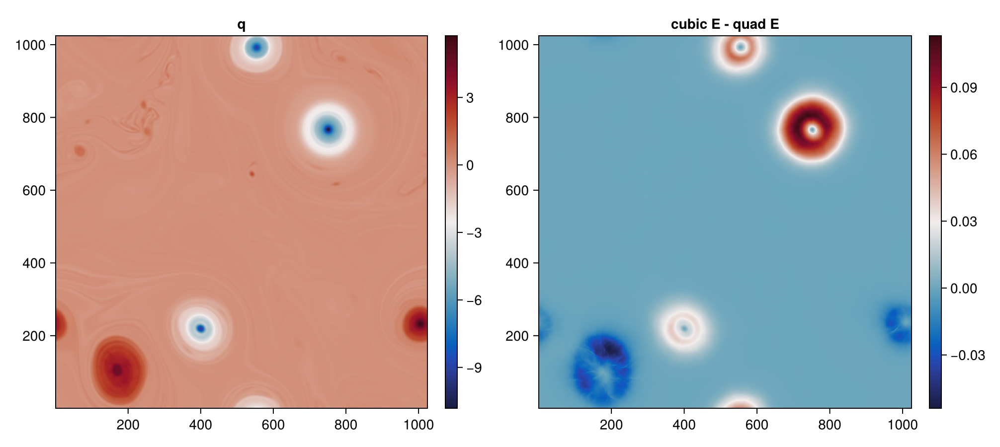

In [56]:
function compute_pv_from_snapshot(snapshot, grid, params)
    return @views @. 1im * grid.kr * snapshot[:,:,2] - 1im * grid.l * snapshot[:,:,1] - params.f * snapshot[:,:,3]
end

qh = compute_pv_from_snapshot(sol1, grid, params)
q = irfft(qh, grid.nx)

fig = Figure()
ax1 = Axis(fig[1,1], title="q")
ax2 = Axis(fig[1,3], title="cubic E - quad E")
hm = heatmap!(ax1, q, colormap=:balance)
Colorbar(fig[1,2], hm)
hm = heatmap!(ax2, E1_diff, colormap=:balance)
Colorbar(fig[1,4], hm)
colsize!(fig.layout, 1, Aspect(1, 1.0))
colsize!(fig.layout, 3, Aspect(1, 1.0))
resize_to_layout!(fig)

save(@sprintf("images/real_space_energy_comparison_Fr=%0.3f.png", Fr), fig)
fig

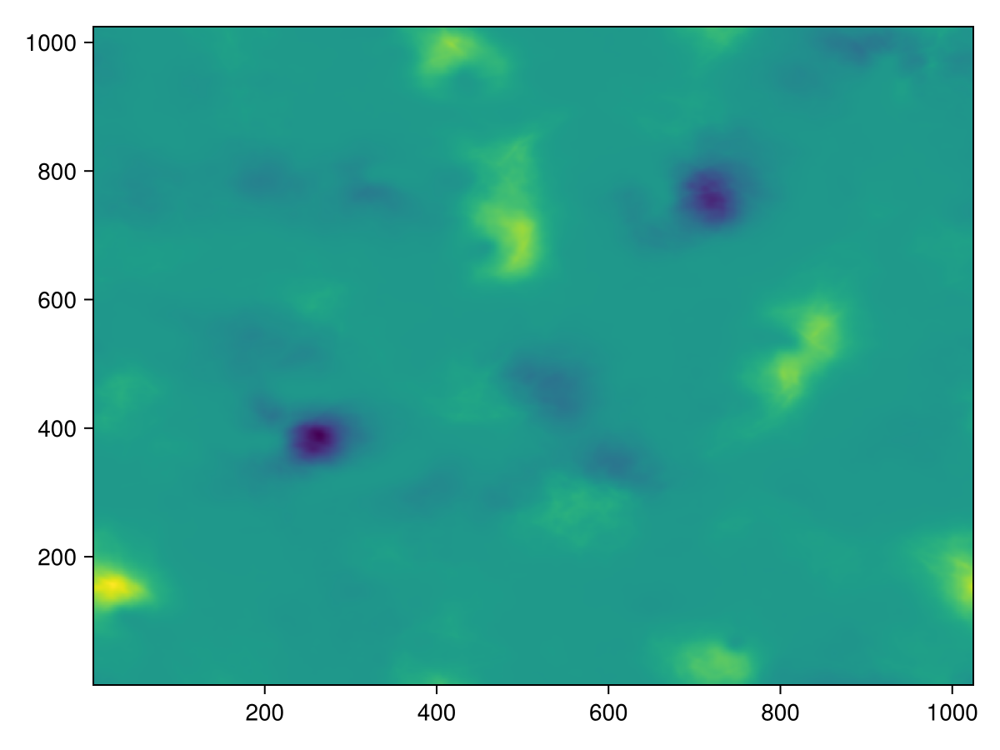

In [44]:
heatmap(E1_diff)

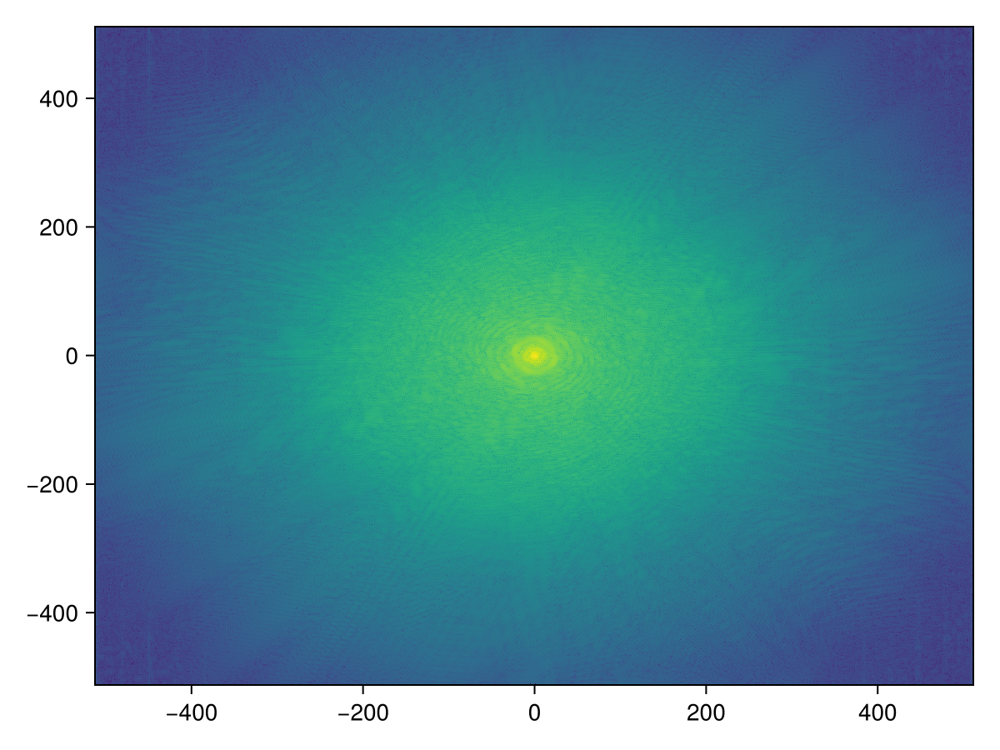

In [44]:
E_diff = (η1.*(u1.^2 + v1.^2))
E_diffh = fft(E_diff)
heatmap(fftshift(grid.k)[:], fftshift(grid.l)[:], fftshift(log.(abs2.(E_diffh))))

In [42]:
function compute_radial_KE_spectrum(sol, grid, params)
    uh = sol[:,:,1]
    vh = sol[:,:,2]
    ηh = sol[:,:,3]
    u = irfft(uh, grid.nx)
    v = irfft(vh, grid.nx)
    η = irfft(ηh, grid.nx)
    mu = @. sqrt(1 + η) * u
    mv = @. sqrt(1 + η) * v

    muh = rfft(mu)
    mvh = rfft(mv)
    ρ, Ehr = FourierFlows.radialspectrum(0.5*(abs2.(muh) + abs2.(mvh)) / grid.nx^2 / grid.Lx^2, grid)
    ((ugh, vgh, ηgh), (uwh, vwh, ηwh)) = wave_balanced_decomposition(uh, vh, ηh, grid, params)
    ug2_total = (FourierFlows.parsevalsum2(ugh, grid) + FourierFlows.parsevalsum2(vgh, grid))
    ug_rms = sqrt.(ug2_total/grid.Lx/grid.Ly)
    return ρ, Ehr[:], ug_rms/sqrt.(params.Cg2)
end

run_directory = "/vast/nad9961/rsw/66007029/1"
run_directory2 = "/vast/nad9961/rsw/66007029/2"
nx, Lx = get_grid_size(run_directory, "rsw")
grid = TwoDGrid(; nx, Lx)
f, Cg2 = read_rsw_params(run_directory)
Kd = f/sqrt(Cg2)
ν, nν = read_rsw_dissipation(run_directory)
params = (; f, Cg2, ν, nν)
bases = compute_balanced_wave_bases(grid, params)

Nsnaps = count_key_snapshots(run_directory, "rsw")
t0, sol0 = load_key_snapshot(run_directory, "rsw", 1)
t = Observable(t0)
ρ1 = Observable([0.0])
Er1 = Observable([0.0])
Fr1 = Observable(0.0)
ρ2 = Observable([0.0])
Er2 = Observable([0.0])
Fr2 = Observable(0.0)


fig = Figure(; size=(800, 600), fontsize=32, fonts = (; regular = "Dejavu"))
ytickvals=10. .^ (-12:2:2)
yticklabels = [rich("10", superscript(@sprintf("%d", value))) for value=-12:2:2]
yminorticks = 10. .^ ((-12:2) .+ 0.5)
xminorticks = 10. .^ (0.25:0.25:3)
ax_opts = (; xscale=log10, yscale=log10,
        xlabel="K/Kd", xticks=[1, 10, 100, 1000], 
        yticks=(ytickvals, yticklabels),
        xminorticks,
        xminorgridvisible=true,
        yminorticks,
        yminorgridvisible=true,
        limits=((1/Kd, grid.kr[end]/Kd), (1e-8, 1e2))
)

ax = Axis(fig[1,1]; title=@lift(@sprintf("t = %0.1f\nFr1 = %0.3f\nFr2 = %0.3f", $t, $Fr1, $Fr2)), ax_opts...)

lines!(ax, ρ1, Er1; linewidth=2, color=:black, label=@sprintf("Fr1"))
lines!(ax, ρ2, Er2; linewidth=2, color=:red, label=@sprintf("Fr2"))
#lines!(ax, ρ1, 15*(ρ1*Kd).^(-2); linewidth=2, color=:blue, label="ω^-2")
axislegend(ax, position=:rt)

frames = 1:500
record(fig, "spectral_energy_animation.mp4", frames, framerate=10) do frame
    t1, sol1 = load_key_snapshot(run_directory, "rsw", frame)
    t2, sol2 = load_key_snapshot(run_directory2, "rsw", frame)
    t[] = t1
    ρa, Ehra, Fra = compute_radial_KE_spectrum(sol1, grid, params)
    ρ1[] = ρa/Kd
    Er1[] = Ehra
    Fr1[] = Fra
    ρb, Ehrb, Frb = compute_radial_KE_spectrum(sol2, grid, params)
    ρ2[] = ρb/Kd
    Er2[] = Ehrb
    Fr2[] = Frb
end

"spectral_energy_animation.mp4"

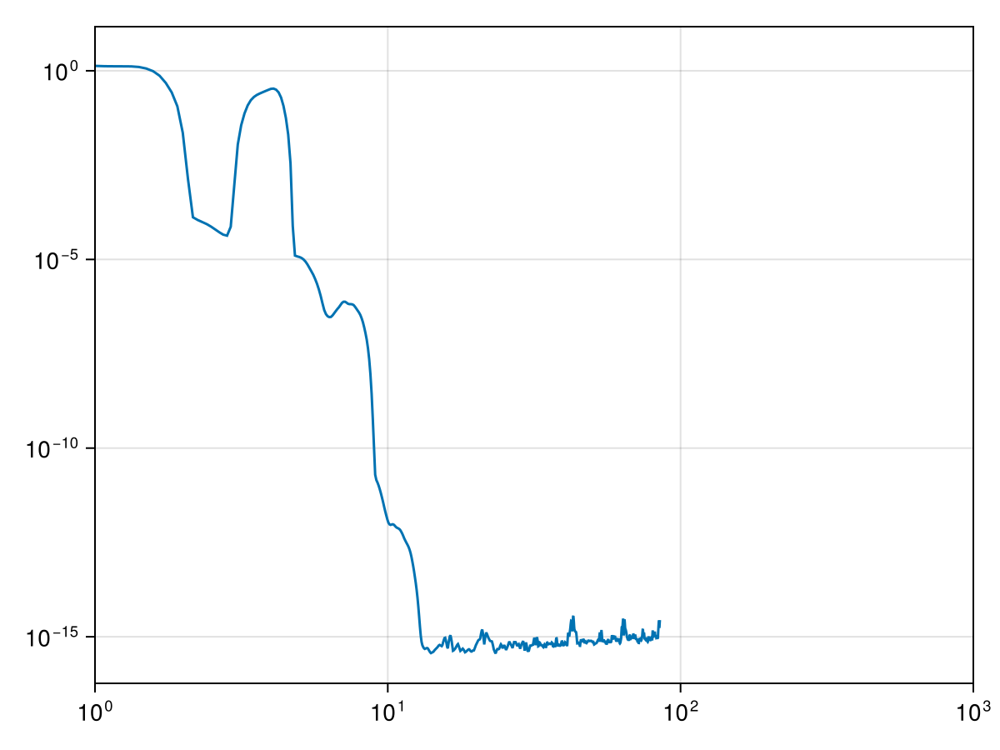

In [32]:
lines(ρ1, Er1[]; axis=(; xscale=log10, yscale=log10))

In [12]:
t1, sol1 = load_key_snapshot(run_directory, "rsw", 123)
t2, sol2 = load_key_snapshot(run_directory2, "rsw", 123)
println(t1, " ", t2)

121.7558 121.24298
